# Installs

In [3]:
# Install Assistive Gym
%pip install git+https://github.com/Healthcare-Robotics/assistive-gym.git
# Specific installs just for Google Colab (not needed on local installs)
%pip uninstall dataclasses -y
%pip install "numpy<1.17" --upgrade
%pip install stable-baselines3

  Cloning https://github.com/Healthcare-Robotics/assistive-gym.git to /tmp/pip-req-build-kj26e2ev
  Running command git clone -q https://github.com/Healthcare-Robotics/assistive-gym.git /tmp/pip-req-build-kj26e2ev
  Resolved https://github.com/Healthcare-Robotics/assistive-gym.git to commit fb799c377e1f144ff96044fb9096725f7f9cfc61
  Cloning https://github.com/Zackory/bullet3.git to /tmp/pip-install-a02yd_3c/pybullet_197db92d83ae440aa10179f8cc6310dd
  Running command git clone -q https://github.com/Zackory/bullet3.git /tmp/pip-install-a02yd_3c/pybullet_197db92d83ae440aa10179f8cc6310dd
  Resolved https://github.com/Zackory/bullet3.git to commit 0e932fd9f0fe538bbf966ac6689b7c524db14f5e
  Using cached dataclasses-0.6-py3-none-any.whl (14 kB)
Note: you may need to restart the kernel to use updated packages.
Found existing installation: dataclasses 0.6
Uninstalling dataclasses-0.6:
  Successfully uninstalled dataclasses-0.6
Note: you may need to restart the kernel to use updated packages.
  

# Imports

In [1]:
import assistive_gym
from stable_baselines3 import PPO
from stable_baselines3.common.cmd_util import make_vec_env
from stable_baselines3.common.vec_env import VecNormalize, SubprocVecEnv
from stable_baselines3.common import evaluation
import os, multiprocessing
from numpngw import write_apng
from IPython.display import Image

/home/yashjakhotiya/anaconda3/envs/agpy37/lib/python3.7/site-packages/stable_baselines3/common/cmd_util.py:6: FutureWarning: Module ``common.cmd_util`` has been renamed to ``common.env_util`` and will be removed in the future.
  "Module ``common.cmd_util`` has been renamed to ``common.env_util`` and will be removed in the future.", FutureWarning


# Config

In [ ]:
timesteps = 100000
env_name = 'FeedingBaxter-v1'

# Training

In [2]:
%%time
num_processes = multiprocessing.cpu_count()
print(f'num_processes: {num_processes}')
# Create a vectorized and normalized environment
env = make_vec_env(env_name, n_envs=1)
env = VecNormalize(env, norm_obs=True, norm_reward=True, clip_obs=10.)
print('env initialized')
# Train a PPO policy
model = PPO('MlpPolicy', env, verbose=0, device='cpu')
print('model initialized. starting learning')
model.learn(total_timesteps=timesteps)
# Save policy and VecNormalize statistics
model.save(os.path.join('baselines3_ppo', env_name))
env.save(os.path.join('baselines3_ppo', '%s_vec_normalize.pkl' % env_name))

num_processes: 20
pybullet build time: Mar  8 2022 23:03:50


Using TensorFlow backend.
/home/yashjakhotiya/anaconda3/envs/agpy37/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/yashjakhotiya/anaconda3/envs/agpy37/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/yashjakhotiya/anaconda3/envs/agpy37/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where

env initialized
model initialized. starting learning
CPU times: user 36min 47s, sys: 18 s, total: 37min 5s
Wall time: 32min 59s


# Eval

In [3]:
# Load the policy
model = PPO.load(os.path.join('baselines3_ppo', env_name))
# Load the saved statistics
eval_env = make_vec_env(env_name, n_envs=1)
eval_env = VecNormalize.load(os.path.join('baselines3_ppo', '%s_vec_normalize.pkl' % env_name), eval_env)
# We don't need to train the policy or normalize reward
eval_env.training = False
eval_env.norm_reward = False
# Setup a camera in the environment for rendering
eval_env.envs[0].setup_camera(camera_eye=[0.5, -0.75, 1.5], camera_target=[-0.2, 0, 0.75], fov=60, camera_width=1920//4, camera_height=1080//4)

obs = eval_env.reset()
frames = []
done = False
while not done:
    # Compute the next action using the trained policy
    action, _states = model.predict(obs)
    # Step the simulation forward. Have the robot take a random action.
    obs, reward, done, info = eval_env.step(action)
    # Capture (render) an image from the camera
    img, depth = eval_env.envs[0].get_camera_image_depth()
    frames.append(img)
write_apng('output_baselines3_%s.png' % env_name, frames, delay=100)

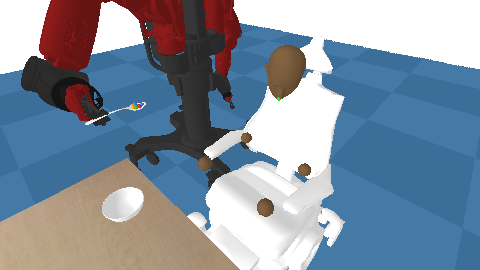

In [4]:
Image(filename='output_baselines3_%s.png' % env_name)

In [5]:
mean_reward, std_reward = evaluation.evaluate_policy(model, eval_env, n_eval_episodes=100, deterministic=True)
print(f'mean_reward={mean_reward:.2f} +/- {std_reward}')

mean_reward=-96.55 +/- 61.63829351723046
